In [1]:
import itertools
import sys, os

import numpy as np
import pandas as pd
from scipy.special import comb
from scipy import stats
import scipy.cluster.hierarchy as hac
import matplotlib.pyplot as plt
plt.style.use('classic')
%matplotlib inline
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn import metrics

sns.set(rc={'figure.figsize':(15,8)})
sns.set_context('poster')
from sklearn.model_selection import train_test_split

In [4]:
%load_ext autoreload
%autoreload 2
import CCPA_lib as cp


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [5]:
sns.set_context('poster')
sns.set_style('white')

In [6]:
ppallete = 'RdYlGn'#'YlGn_d' #"BuGn_d"
porder = ['MED4',  'MIT9312','MIT0604', 'Natl2A', 'MIT9313']
ppallete = [ '#62A586', '#face6e','#f79934', '#7A9BC8', '#F47681', ]
# #ffd7a1
    
pedge = 'green'
apallete = "spring"
aorder = ['DE', 'DE1', '1A3', 'ATCC', 'BS11']
amarkers = ['X', 'P', 's', 'D', 'o']
aedge='orange'
epallete = ['#6cf0ba', '#d13f75', '#eeb7cb', '#b9d2d8', '#407f90']
#sns.diverging_palette(355, 217, s=74, l=50, n=4) #'Paired' # 'BrBG'# "coolwarm"
eorder = ['e1','e3', 'e4', 'e5', 'e6']
#aedge='orange'

espallete = ['#6cf0ba', '#D55282', '#538B9B']
#  604 #FCC479
#     #ffd7a1
#     #fcb14c
#     MED4 = #62A586
#     9313 #F47681
#     natl #7A9BC8

In [7]:
df = pd.read_pickle('CCPA.pkl.gz')
df.loc[df.PRO == 'C9B', 'PRO'] = 'MIT0604'

In [8]:
dfw = df.loc[(df.experiment.isin(['e1', 'e3', 'e4','e5', 'e6']))]

In [9]:
#dfw = df.loc[(df.experiment.isin(['e1','e3', 'e4','e5', 'e6'])) # & (df.culture == 'Co_Culture')
#            ]

In [10]:
dfdecline = cp.generate_decline(dfw, scale=False)
#dfdecline = dfdecline.loc[dfdecline['day'] <= 80]

In [11]:
dfdecline.head()

,experiment_sample,day,FL,experiment,sample,PRO,ALT,culture
0,"e1, 10A",0.000000,5.621,e1,10A,MIT0604,DE,Co_Culture
1,"e1, 10A",0.893056,4.045,e1,10A,MIT0604,DE,Co_Culture
2,"e1, 10A",1.991667,2.749,e1,10A,MIT0604,DE,Co_Culture
3,"e1, 10A",4.697222,2.924,e1,10A,MIT0604,DE,Co_Culture
4,"e1, 10A",5.700000,2.519,e1,10A,MIT0604,DE,Co_Culture


In [56]:
for n, f in [
    ('exponential', cp.model_exponential1),
    #('hyperbolic', cp.model_hyperbolic),
    ('harmonic', cp.model_harmonic),
]:
    #f = cp.model_exponential
    t = dfdecline.groupby('experiment_sample').apply(lambda x: cp.apply_fit1(x, f, print_popt=False))
    dfdecline[n] = t['y_pred']
    for i in range(3):
        dfdecline[f'{n}_popt_{i}'] = t[f'popt_{i}']
#dfdecline['decline'] = dfdecline.FL
#dfdecline['exponential_diff'] = dfdecline.FL - dfdecline.exponential
#dfdecline['decline_scaled'] = dfdecline.groupby('experiment_sample').FL.transform(lambda x: x / x.max())
#df_exp_coef = dfdecline.groupby(['experiment_sample','popt_0', 'popt_1', 'popt_2'])['decline'].count().reset_index(level=[1,2,3])\
#.drop(columns='decline')

In [57]:
dfdecline.columns

Index(['experiment_sample', 'day', 'FL', 'experiment', 'sample', 'PRO', 'ALT',
       'culture', 'exponential', 'exponential_popt_0', 'exponential_popt_1',
       'exponential_popt_2', 'harmonic', 'harmonic_popt_0', 'harmonic_popt_1',
       'harmonic_popt_2'],
      dtype='object')

In [58]:
dfdecline.head()

,experiment_sample,day,FL,experiment,sample,PRO,ALT,culture,exponential,exponential_popt_0,exponential_popt_1,exponential_popt_2,harmonic,harmonic_popt_0,harmonic_popt_1,harmonic_popt_2
0,"e1, 10A",0.000000,5.621,e1,10A,MIT0604,DE,Co_Culture,5.621000,0.141021,1.0,1.0,5.621000,0.296513,0.5,0.5
1,"e1, 10A",0.893056,4.045,e1,10A,MIT0604,DE,Co_Culture,4.955857,0.141021,1.0,1.0,4.444171,0.296513,0.5,0.5
2,"e1, 10A",1.991667,2.749,e1,10A,MIT0604,DE,Co_Culture,4.244581,0.141021,1.0,1.0,3.533985,0.296513,0.5,0.5
3,"e1, 10A",4.697222,2.924,e1,10A,MIT0604,DE,Co_Culture,2.898240,0.141021,1.0,1.0,2.349141,0.296513,0.5,0.5
4,"e1, 10A",5.700000,2.519,e1,10A,MIT0604,DE,Co_Culture,2.516052,0.141021,1.0,1.0,2.089493,0.296513,0.5,0.5


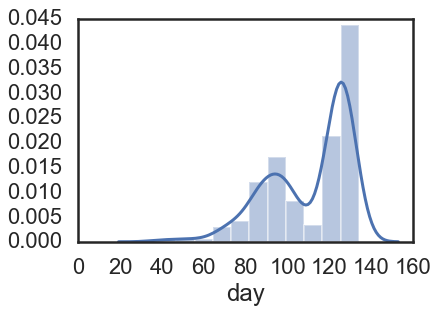

In [59]:
sns.distplot(dfdecline.groupby('experiment_sample')['day'].max()) #.sort_values()

In [60]:
def _compute_score_model(x,m):
    res = {f'{m}_popt_{i}' : x[f'{m}_popt_{i}'].unique()[0] for i in range(3)}
    if np.isnan(res[f'{m}_popt_0']):
        res.update({
            f'rmse_{m}' : np.NaN,
            f'rmse_{m}_60' : np.NaN,
            f'rmse_{m}_5' : np.NaN,
            f'bic_{m}' : np.NaN,
        })
    else:
        x60 = x.loc[x.day >= 60]
        x5 = x.loc[x.day <= 5]
        n = x.shape[0]
        num_params = 3 if m == 'hyperbolic' else 2
        res.update({
            f'rmse_{m}' : np.sqrt(metrics.mean_squared_error(x['FL'], x[m])),
            f'rmse_{m}_60' : np.sqrt(metrics.mean_squared_error(x60['FL'], x60[m])) if x60.shape[0]>2 else np.NaN,
            f'rmse_{m}_5' : np.sqrt(metrics.mean_squared_error(x5['FL'], x5[m])),
            f'bic_{m}' : n * np.log(metrics.mean_squared_error(x['FL'], x[m])) + num_params * np.log(n),
        })
    return res

def _compute_r2(x):
    models = ['exponential', #'hyperbolic',
              'harmonic', ]
    res_list = [_compute_score_model(x,m) for m in models]
    res =dict()
    for i in res_list:
        res.update(i)
    return pd.Series(res)
groupcols = ['experiment_sample', 'experiment', 'sample', 'PRO', 'ALT', 'culture', ]
dfscore = dfdecline.groupby(groupcols).apply(_compute_r2).reset_index()

In [61]:
dfscorem = dfscore.melt(id_vars=['experiment_sample', 'experiment', 'sample', 'PRO', 'ALT', 'culture'],
                        value_vars=['rmse_exponential', #'rmse_hyperbolic', 
                                    'rmse_harmonic', 
                                    'rmse_exponential_60', #'rmse_hyperbolic_60', 
                                    'rmse_harmonic_60',
                                    'rmse_exponential_5', #'rmse_hyperbolic_5',
                                    'rmse_harmonic_5',
                                    'bic_exponential', #'bic_hyperbolic', 
                                    'bic_harmonic'
                                    
                                   ], 
                        value_name='RMSE',
                        var_name='model')


In [62]:
dfscorem['s'] = dfscorem['sample'] +', '+ dfscorem.ALT
dfscorem['e'] = dfscorem['experiment'] +', '+ dfscorem.culture
dfscorem['p'] = dfscorem['PRO'] 
dfscorem.loc[dfscorem.culture == 'Axenic', 'p'] =dfscorem.loc[dfscorem.culture == 'Axenic', 'p']+ ' Axenic'



Text(0.5,1,'root mean square error per model')

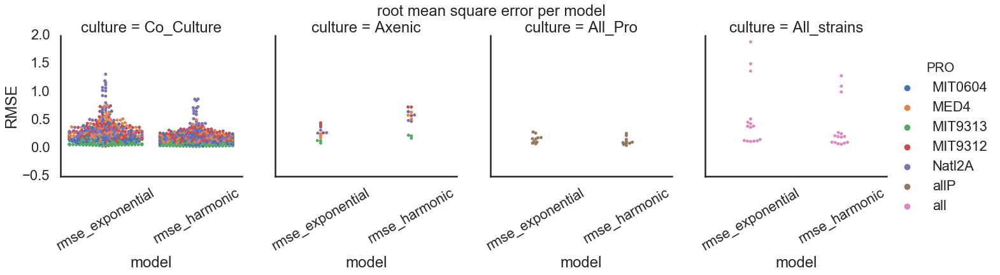

In [63]:
cols=['rmse_exponential',# 'rmse_hyperbolic', 
      'rmse_harmonic', 
      #'rmse_exponential_60', 'rmse_hyperbolic_60', 'rmse_harmonic_60',
      #'mse_exponential_5', 'mse_hyperbolic_5', 'mse_harmonic_5'
] 

g = sns.catplot(data=dfscorem.loc[dfscorem.model.isin(cols)], x='model', y='RMSE', hue='PRO', kind='swarm', #aspect=2,
           #palette='cubehelix'
            col='culture',
           )
g.set_xticklabels(rotation=30)
#plt.xticks(rotation=45)
plt.suptitle('root mean square error per model', y=1)

C:\Users\wosnat\Anaconda3\lib\site-packages\numpy\core\_methods.py:217: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
C:\Users\wosnat\Anaconda3\lib\site-packages\numpy\core\_methods.py:209: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Text(0.5,1,'RMSE co-culture')

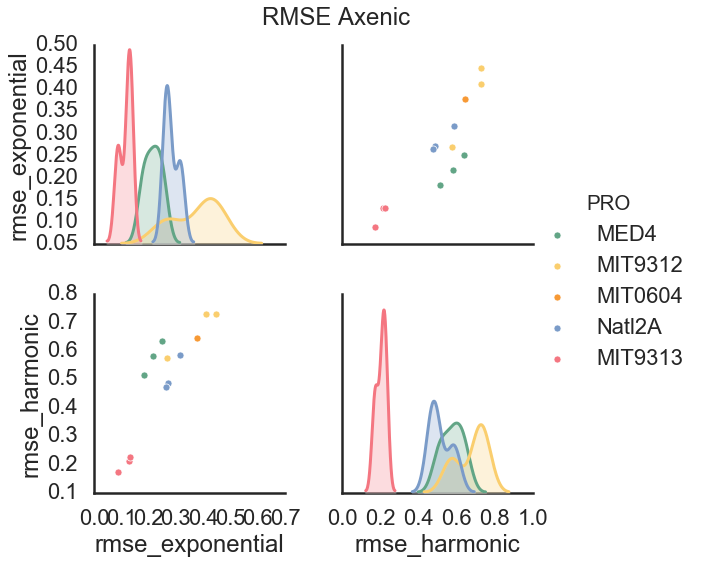

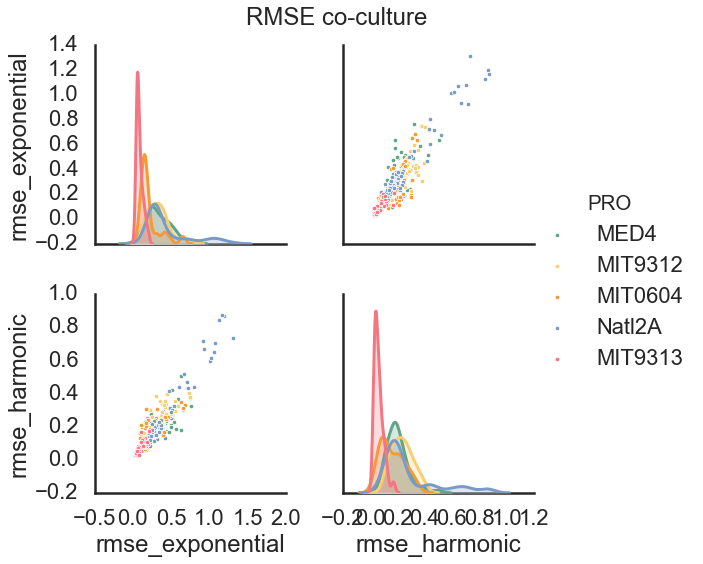

In [64]:
sns.pairplot(dfscore.loc[dfscore.culture == 'Axenic'], 
             vars=['rmse_exponential', #'rmse_hyperbolic', 
                   'rmse_harmonic',
                            #'rmse_exponential_60', 'rmse_hyperbolic_60', 'rmse_harmonic_60'
                            #'rmse_exponential_5', 'rmse_hyperbolic_5', 'rmse_harmonic_5',
                           ],
             height=4, 
             hue='PRO', hue_order=porder, palette=ppallete,
             plot_kws={"s": 50},
             #kind='reg'
            )
plt.suptitle('RMSE Axenic', y=1)
sns.pairplot(dfscore.loc[dfscore.culture == 'Co_Culture'], 
             vars=['rmse_exponential', #'rmse_hyperbolic',
                   'rmse_harmonic',
                            #'rmse_exponential_60', 'rmse_hyperbolic_60', 'rmse_harmonic_60'
                            #'rmse_exponential_5', 'rmse_hyperbolic_5', 'rmse_harmonic_5',
                           ],
             height=4, 
             plot_kws={"s": 20},
             hue='PRO', hue_order=porder, palette=ppallete,
             #kind='reg'
            )
plt.suptitle('RMSE co-culture', y=1)


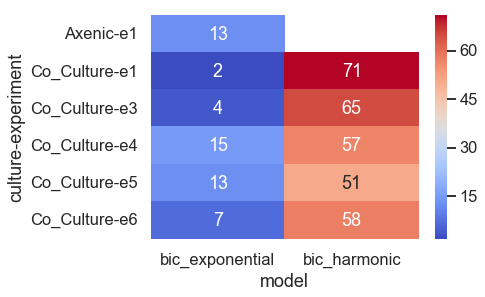

In [65]:
best_model_df = dfscorem.loc[dfscorem.model.isin(['bic_exponential', 'bic_harmonic'])
                            ].sort_values('RMSE', ascending=True).drop_duplicates([
    'experiment_sample', ])
t = best_model_df.loc[best_model_df.culture.isin(['Axenic', 'Co_Culture'])].pivot_table(index=['culture',  'experiment'],columns=['model'], values='sample', aggfunc='count')
sns.set_context('talk')
sns.heatmap(t, annot=True, cmap='coolwarm')


Text(0.5,1,'best model (lowest bic)')

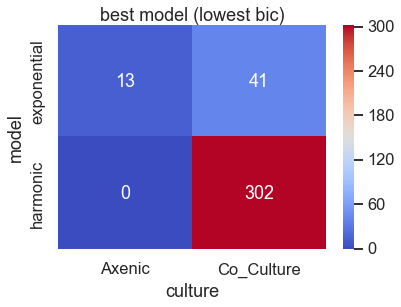

In [107]:
best_model_df = dfscorem.loc[dfscorem.model.isin(['bic_exponential', 'bic_harmonic'])
                            ].sort_values('RMSE', ascending=True).drop_duplicates([
    'experiment_sample', ])
t = best_model_df.loc[best_model_df.culture.isin(['Axenic', 'Co_Culture'])].pivot_table(index=['culture'],columns=['model'], values='sample', aggfunc='count')
t.rename(columns={'bic_exponential': 'exponential', 'bic_harmonic': 'harmonic'}, inplace=True)
t.fillna(0, inplace=True)
for i in t.columns:
    t[i] = t[i].astype(int)
sns.set_context('talk')
sns.heatmap(t.T, annot=True, cmap='coolwarm', fmt='d')
plt.title('best model (lowest bic)')

Text(0.5,1,'best model fit')

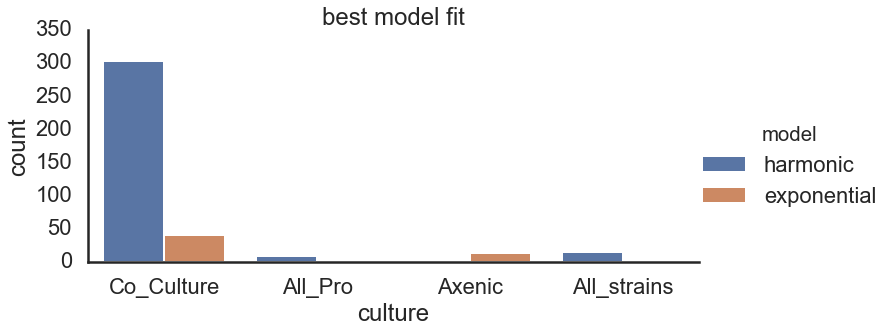

In [119]:
sns.set_context('poster')
best_model_df = dfscorem.loc[dfscorem.model.isin(['bic_exponential', 'bic_harmonic'])
                            ].sort_values('RMSE', ascending=True).drop_duplicates([
    'experiment_sample', ])
best_model_df.model = best_model_df.model.map({'bic_exponential': 'exponential', 'bic_harmonic': 'harmonic'})
sns.catplot(data=best_model_df, x='culture', hue='model', kind='count', aspect=2)
plt.title("best model fit")

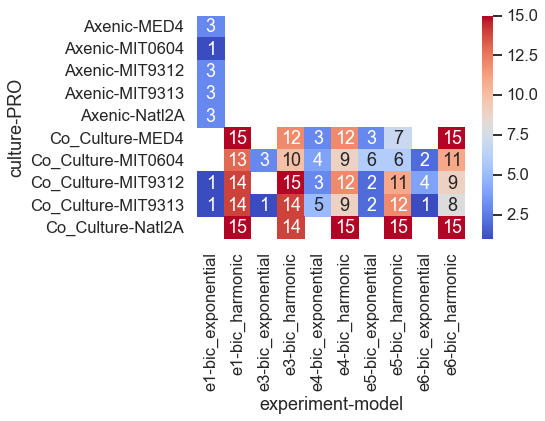

In [67]:
t = best_model_df.loc[best_model_df.culture.isin(['Axenic', 'Co_Culture'])].pivot_table(index=['culture',  'PRO', ],columns=['experiment', 'model', ], values='sample', aggfunc='count')
#sns.set_context('talk')
sns.heatmap(t, annot=True, cmap='coolwarm')


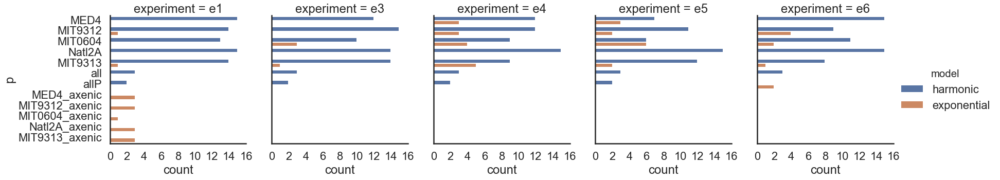

In [131]:
best_model_df['p'] = best_model_df['PRO']
best_model_df.loc[best_model_df.culture == 'Axenic','p'] = best_model_df.loc[best_model_df.culture == 'Axenic','p'] + '_axenic'
sns.catplot(data=best_model_df, y='p', hue='model', kind='count', col='experiment',
           order=['MED4', 'MIT9312', 'MIT0604', 'Natl2A', 'MIT9313', 'all', 'allP',
                     'MED4_axenic', 'MIT9312_axenic', 'MIT0604_axenic', 'Natl2A_axenic', 'MIT9313_axenic'
                     ],
            col_order=eorder,
           )


In [127]:
best_model_df.p.unique()

array(['MIT9313', 'allP', 'MIT0604', 'MIT9313_axenic', 'all', 'MIT9312',
       'MED4', 'Natl2A', 'MED4_axenic', 'Natl2A_axenic', 'MIT9312_axenic',
       'MIT0604_axenic'], dtype=object)

In [128]:
porder

['MED4', 'MIT9312', 'MIT0604', 'Natl2A', 'MIT9313']

In [121]:
best_model_df.head()

,experiment_sample,experiment,sample,PRO,ALT,culture,model,RMSE,s,e,p
2765,"e3, 12B",e3,12B,MIT9313,DE1,Co_Culture,harmonic,-473.582112,"12B, DE1","e3, Co_Culture",MIT9313
2780,"e3, 17C",e3,17C,MIT9313,BS11,Co_Culture,harmonic,-467.243838,"17C, BS11","e3, Co_Culture",MIT9313
2778,"e3, 17A",e3,17A,MIT9313,BS11,Co_Culture,harmonic,-450.771978,"17A, BS11","e3, Co_Culture",MIT9313
2825,"e3, 7B",e3,7B,MIT9313,DE,Co_Culture,harmonic,-449.651791,"7B, DE","e3, Co_Culture",MIT9313
2872,"e4, 22B",e4,22B,MIT9313,ATCC,Co_Culture,harmonic,-447.548600,"22B, ATCC","e4, Co_Culture",MIT9313


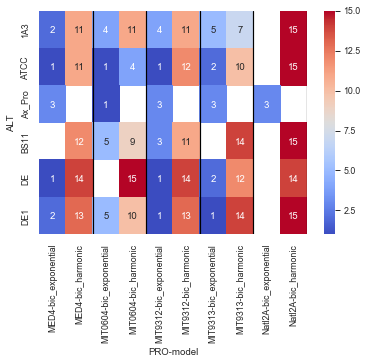

In [68]:

t = best_model_df.loc[best_model_df.culture.isin(['Axenic', 'Co_Culture'])
                     ].pivot_table(index=['ALT'], columns=['PRO','model', ], values='sample', aggfunc='count')
sns.set_context('paper')
sns.heatmap(t, annot=True, cmap='coolwarm' )
for i in [2,4,6,8,10]:
    plt.axvline(i, color='black',)


In [69]:
best_model_df['model'].value_counts()


bic_harmonic       325
bic_exponential     56
Name: model, dtype: int64

In [70]:
best_model_df.head()


,experiment_sample,experiment,sample,PRO,ALT,culture,model,RMSE,s,e,p
2765,"e3, 12B",e3,12B,MIT9313,DE1,Co_Culture,bic_harmonic,-473.582112,"12B, DE1","e3, Co_Culture",MIT9313
2780,"e3, 17C",e3,17C,MIT9313,BS11,Co_Culture,bic_harmonic,-467.243838,"17C, BS11","e3, Co_Culture",MIT9313
2778,"e3, 17A",e3,17A,MIT9313,BS11,Co_Culture,bic_harmonic,-450.771978,"17A, BS11","e3, Co_Culture",MIT9313
2825,"e3, 7B",e3,7B,MIT9313,DE,Co_Culture,bic_harmonic,-449.651791,"7B, DE","e3, Co_Culture",MIT9313
2872,"e4, 22B",e4,22B,MIT9313,ATCC,Co_Culture,bic_harmonic,-447.548600,"22B, ATCC","e4, Co_Culture",MIT9313


In [71]:
dfscore.describe()

,exponential_popt_0,exponential_popt_1,exponential_popt_2,rmse_exponential,rmse_exponential_60,rmse_exponential_5,bic_exponential,harmonic_popt_0,harmonic_popt_1,harmonic_popt_2,rmse_harmonic,rmse_harmonic_60,rmse_harmonic_5,bic_harmonic
count,381.000000,381.000000,381.000000,381.000000,373.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,373.000000,381.000000,381.000000
mean,0.130487,0.738845,0.738845,0.291875,0.175054,0.423349,-164.233254,0.298662,0.750656,0.750656,0.206192,0.109910,0.439923,-205.257675
std,0.097327,0.250079,0.250079,0.236205,0.165209,0.462183,91.227108,0.242124,0.250328,0.250328,0.167540,0.103865,0.505497,92.674483
min,0.019544,0.500000,0.500000,0.029888,0.020403,0.001370,-390.634113,0.041187,0.500000,0.500000,0.026233,0.002040,0.008426,-473.582112
25%,0.062534,0.500000,0.500000,0.142118,0.059211,0.125442,-216.472256,0.156747,0.500000,0.500000,0.101439,0.036880,0.146808,-259.829330
50%,0.104588,0.500000,0.500000,0.237827,0.122545,0.304139,-156.849591,0.236798,1.000000,1.000000,0.176759,0.077781,0.281539,-200.276029
75%,0.174960,1.000000,1.000000,0.368242,0.229596,0.533773,-100.146790,0.370979,1.000000,1.000000,0.248088,0.150757,0.526341,-137.562671
max,0.773035,1.000000,1.000000,1.884844,1.044806,4.183931,101.122262,1.722105,1.000000,1.000000,1.283041,0.696823,3.367423,44.968907


In [72]:
sns.set_context('poster')

In [73]:
dfscore.columns

Index(['experiment_sample', 'experiment', 'sample', 'PRO', 'ALT', 'culture',
       'exponential_popt_0', 'exponential_popt_1', 'exponential_popt_2',
       'rmse_exponential', 'rmse_exponential_60', 'rmse_exponential_5',
       'bic_exponential', 'harmonic_popt_0', 'harmonic_popt_1',
       'harmonic_popt_2', 'rmse_harmonic', 'rmse_harmonic_60',
       'rmse_harmonic_5', 'bic_harmonic'],
      dtype='object')

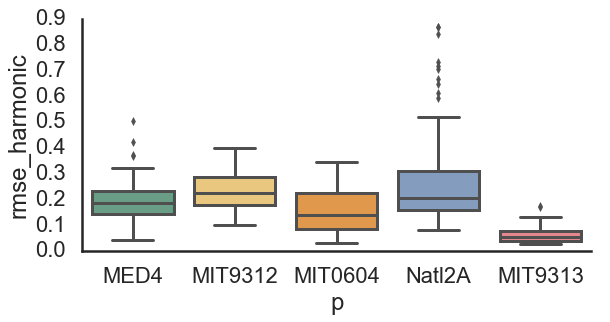

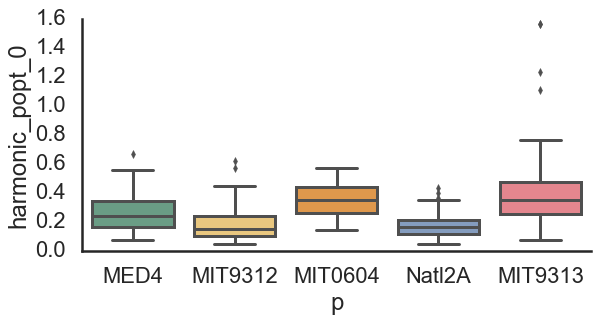

In [77]:
dfscore['p'] = dfscore.PRO
dfscore.loc[dfscore.culture=='Axenic','p'] = dfscore.loc[dfscore.culture=='Axenic','p'] + '_Axenic'

for i in ['rmse_harmonic', 'harmonic_popt_0', ]:
    sns.catplot(data=dfscore.loc[dfscore.culture =='Co_Culture'], 
                x='p', y=i, kind='box',
           order=porder, palette=ppallete,
           aspect=1.8)


In [75]:
best_model_df.loc[best_model_df.model == 'bic_hyperbolic', 'experiment_sample']

Series([], Name: experiment_sample, dtype: object)

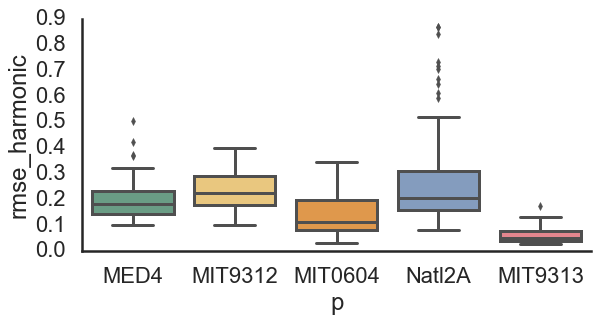

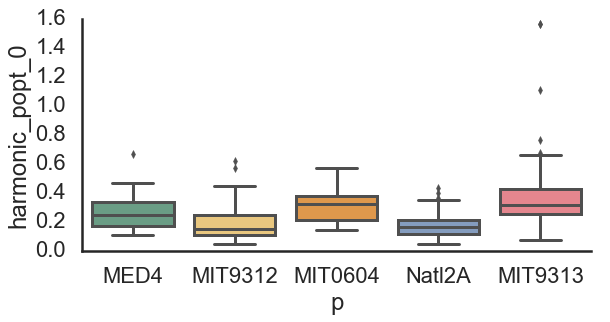

In [76]:
dfscore['p'] = dfscore.PRO
dfscore.loc[dfscore.culture=='Axenic','p'] = dfscore.loc[dfscore.culture=='Axenic','p'] + '_Axenic'

for i in ['rmse_harmonic', 'harmonic_popt_0',  ]:
    sns.catplot(data=dfscore.loc[#(dfscore.culture =='Co_Culture') &
                                dfscore.experiment_sample.isin(
                                    best_model_df.loc[best_model_df.model == 'bic_harmonic', 'experiment_sample'])
                                ], 
                x='p', y=i, kind='box',
           order=porder, palette=ppallete,
           aspect=1.8)
    



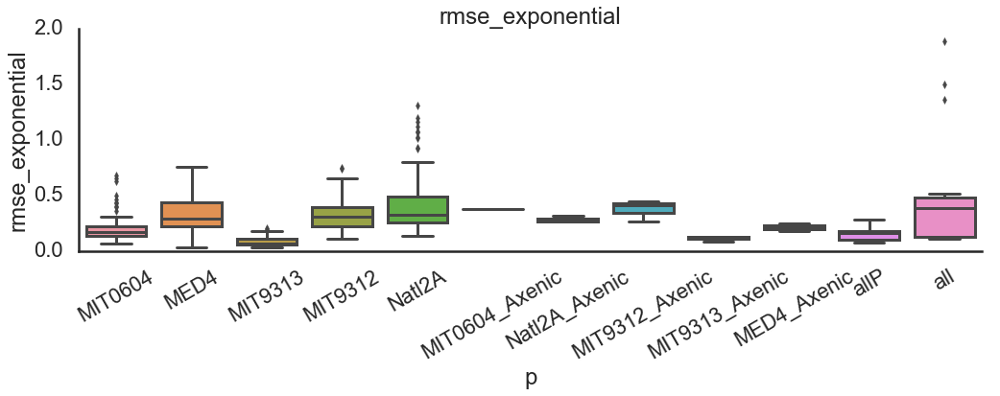

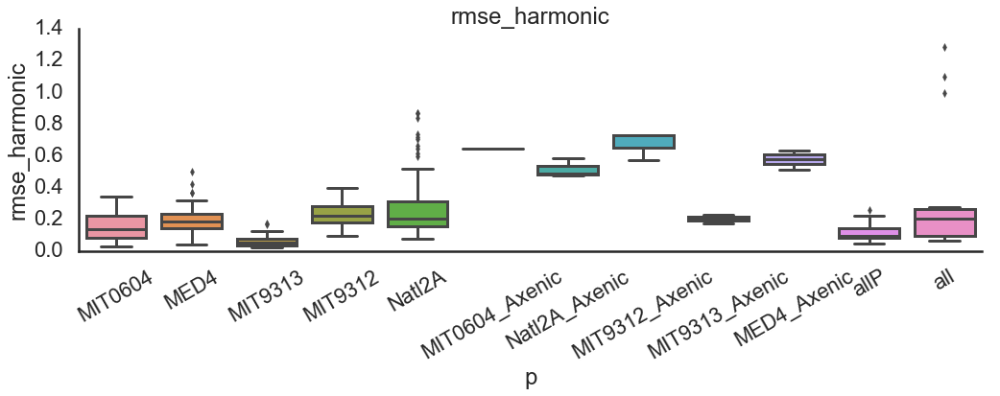

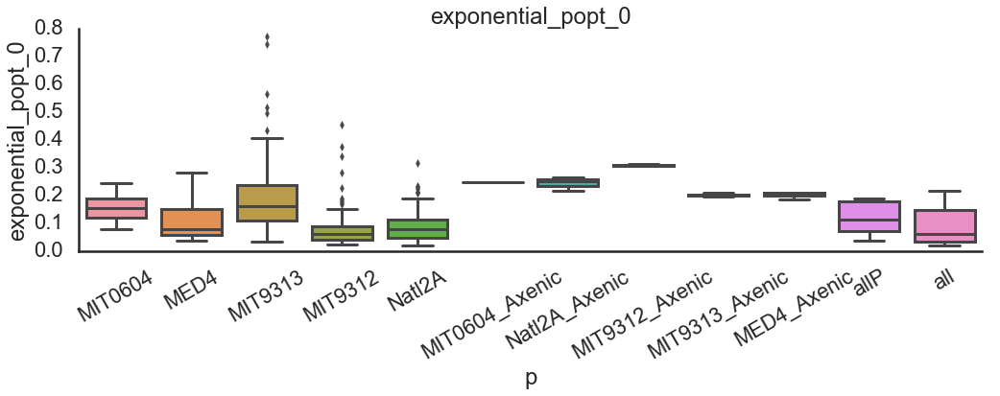

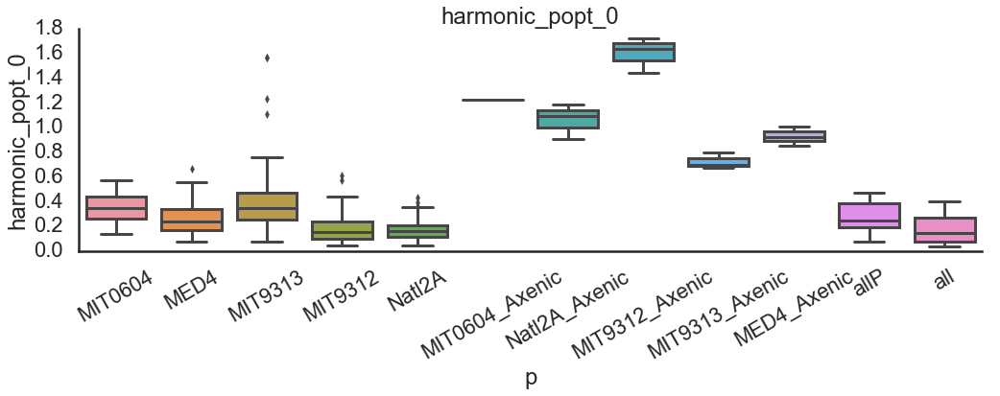

In [120]:
dfscore['p'] = dfscore.PRO
dfscore.loc[dfscore.culture.isin(['Axenic']),'p'] = dfscore.loc[dfscore.culture.isin(['Axenic']),'p'] + '_Axenic'

for i in ['rmse_exponential','rmse_harmonic', 'exponential_popt_0',  'harmonic_popt_0']:
    sns.catplot(data=dfscore, 
                x='p', y=i, kind='box',
           #order=porder, palette=ppallete,
           aspect=3)
    #plt.yscale('log')
    plt.xticks(rotation=30)
    plt.title(i)


In [111]:
dfscore.head()

,experiment_sample,experiment,sample,PRO,ALT,culture,exponential_popt_0,exponential_popt_1,exponential_popt_2,rmse_exponential,...,rmse_hyperbolic_5,bic_hyperbolic,harmonic_popt_0,harmonic_popt_1,harmonic_popt_2,rmse_harmonic,rmse_harmonic_60,rmse_harmonic_5,bic_harmonic,p
0,"e1, 10A",e1,10A,MIT0604,DE,Co_Culture,0.012780,0.991545,0.5,0.724620,...,0.598284,-226.985458,0.255518,5.053455,1.0,0.256265,0.163775,0.519720,-206.384711,MIT0604
1,"e1, 10B",e1,10B,MIT0604,DE,Co_Culture,0.012878,1.140255,0.5,0.716624,...,0.441158,-223.411736,0.215056,5.098205,1.0,0.289069,0.172433,0.409377,-187.353333,MIT0604
2,"e1, 10C",e1,10C,MIT0604,DE,Co_Culture,0.011967,0.937424,0.5,0.747768,...,0.505603,-232.844747,0.321797,5.523854,1.0,0.241878,0.188193,0.316664,-215.513794,MIT0604
3,"e1, 11A",e1,11A,MED4,DE1,Co_Culture,0.080379,6.027784,0.5,0.408427,...,0.591806,-233.377882,0.345333,8.566900,1.0,0.267253,0.106491,0.959647,-202.365715,MED4
4,"e1, 11B",e1,11B,MED4,DE1,Co_Culture,0.053286,3.198720,1.0,0.612492,...,0.326442,-266.861616,0.357929,7.206840,0.5,0.172664,0.098179,0.384576,-268.773315,MED4


In [87]:
best_model_df.columns

Index(['experiment_sample', 'experiment', 'sample', 'PRO', 'ALT', 'culture',
       'model', 'RMSE', 's', 'e', 'p'],
      dtype='object')

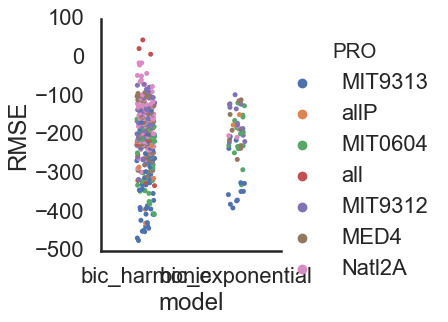

In [88]:
sns.catplot(data=best_model_df, x='model', y='RMSE', hue='PRO')

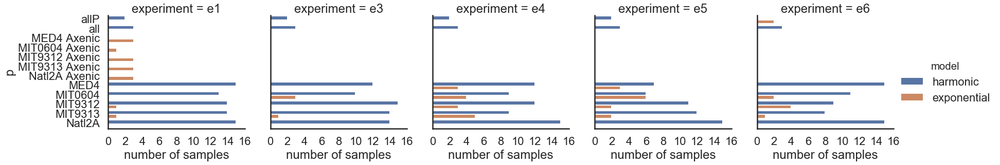

In [84]:
df_best_count = best_model_df.groupby(['culture','p', 'experiment',  'model'])['sample'].count().reset_index()
df_best_count.model =df_best_count.model.map({'bic_exponential': 'exponential', 'bic_harmonic': 'harmonic'})
df_best_count.rename(columns={'sample': 'number of samples'}, inplace=True)

sns.catplot(data=df_best_count,y='p', hue='model', x='number of samples', #row='culture',
            col='experiment', kind='bar')

In [80]:
value_vars = [ 'FL', 'exponential', #'hyperbolic',
              'harmonic',
             ]
id_vars = ['experiment_sample', 'day',  'experiment', 'sample', 'PRO', 'ALT',
       'culture', ]      
dfresm = dfdecline.melt(value_vars=value_vars, id_vars=id_vars )

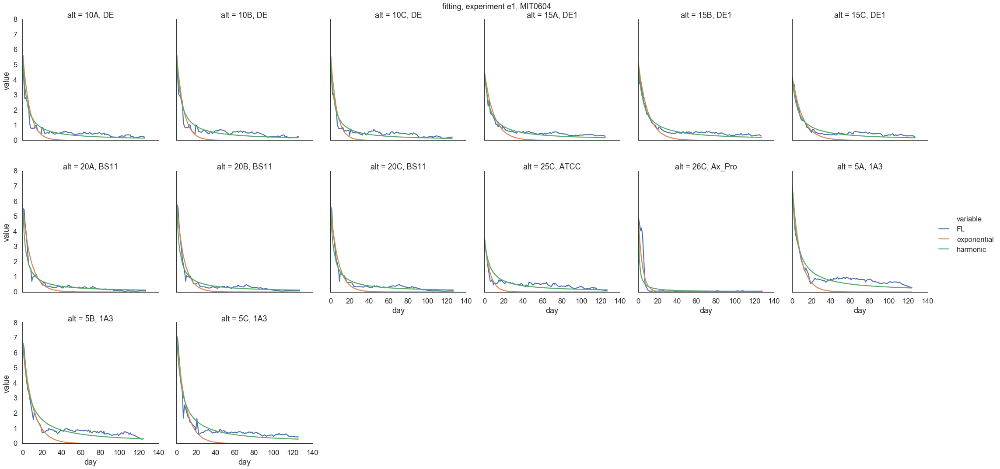

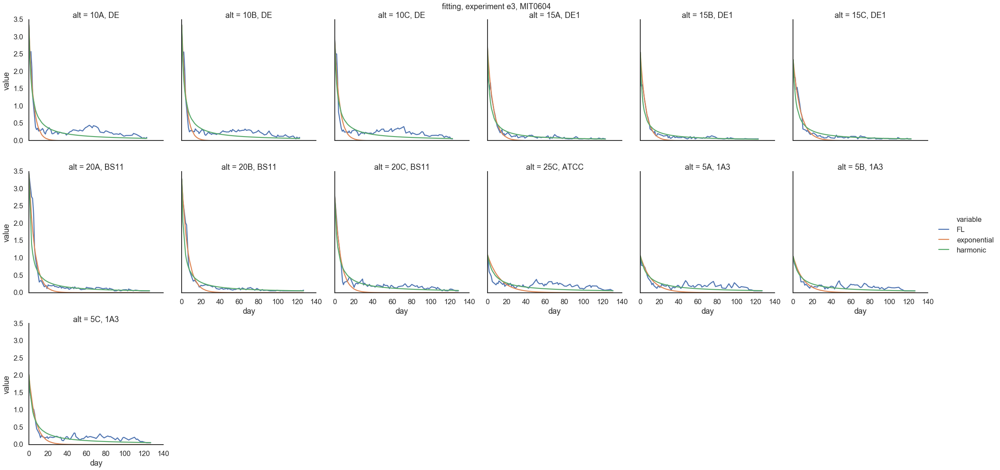

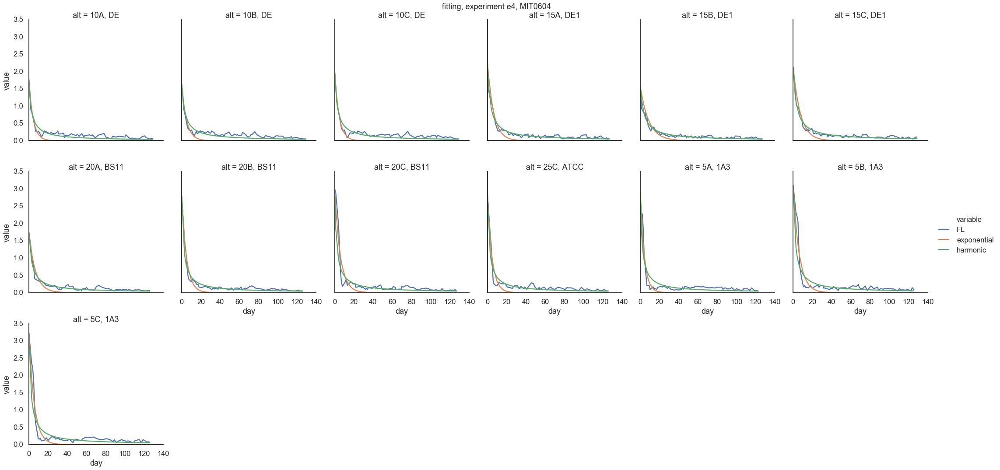

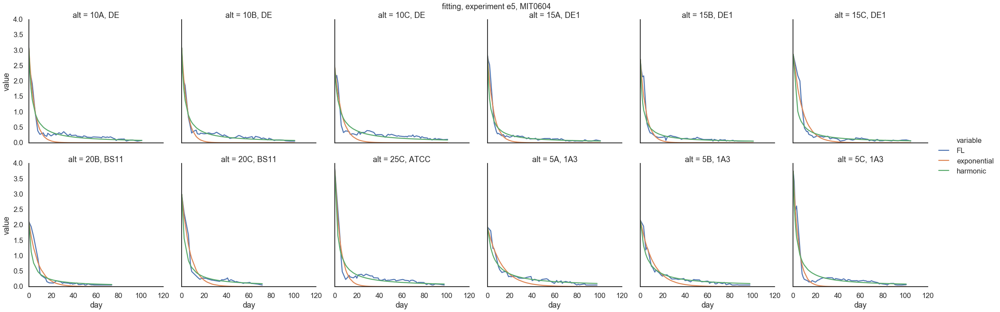

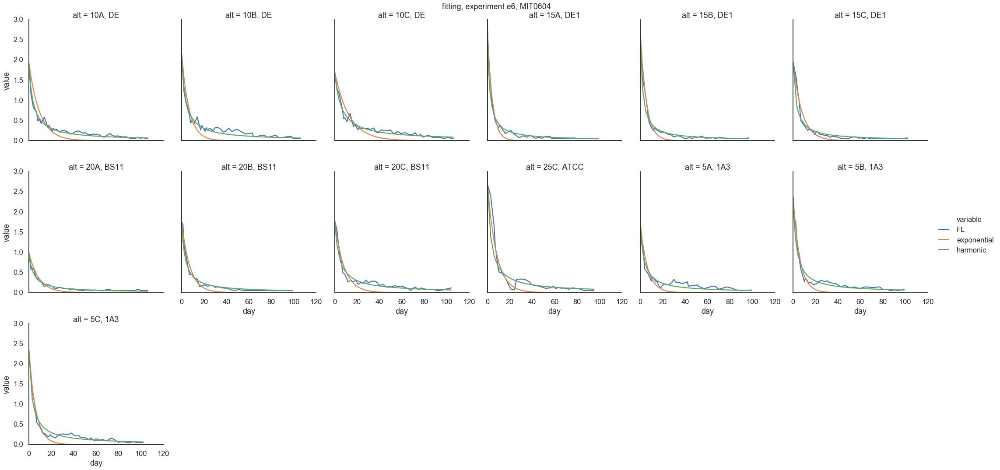

...

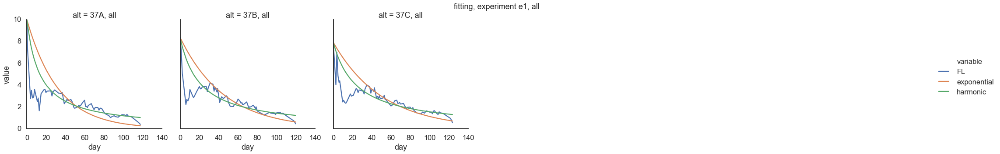

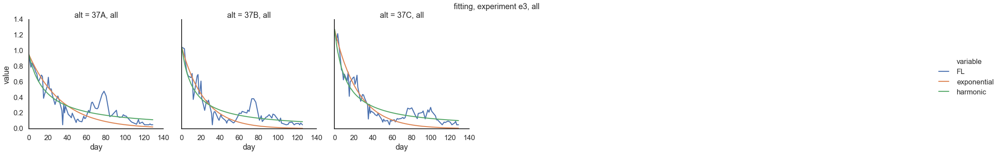

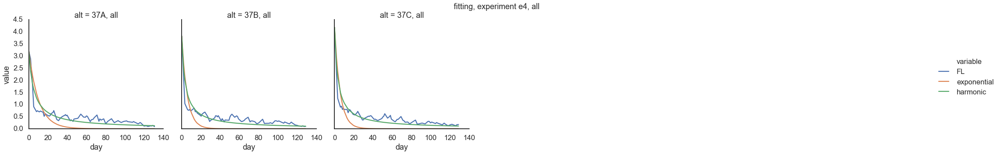

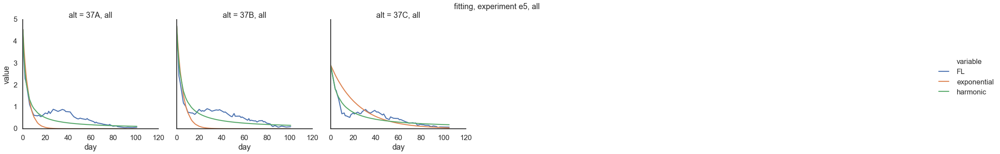

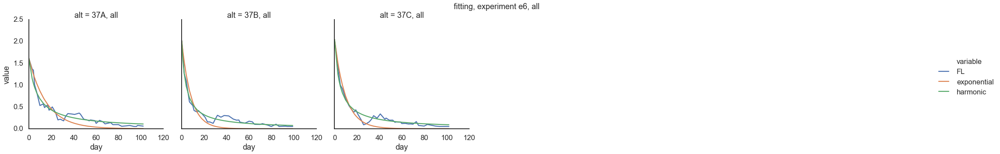

In [105]:
dfresm['alt'] = dfresm['sample'] +', '+dfresm['ALT']
for p in dfresm.PRO.unique():
    for e in dfresm.experiment.unique():
        sns.relplot(data=dfresm.loc[(dfresm.experiment == e) & (dfresm.PRO == p)], 
                x='day',
                y='value',
                hue='variable',
                col='alt',
                col_wrap=6,
                kind='line',
               )
        plt.suptitle(f'fitting, experiment {e}, {p}', y=1)
        plt.show()

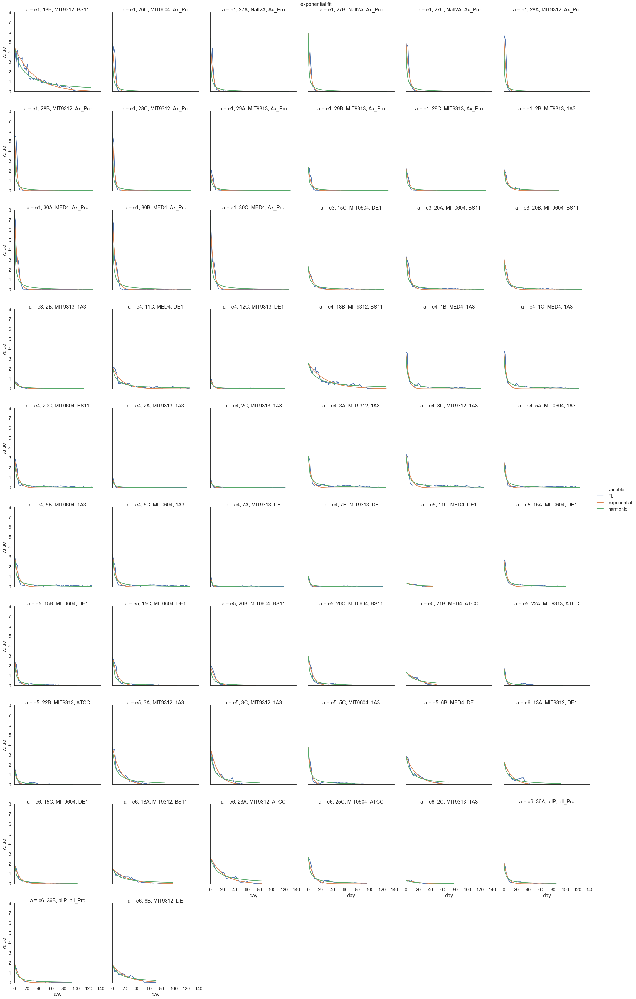

In [101]:
sns.set_context('talk')
dfresm['a'] = dfresm['experiment_sample'] +', '+dfresm['PRO']+', '+dfresm['ALT']
#for p in dfresm.PRO.unique():
#    for e in dfresm.experiment.unique():
exponential_samples = best_model_df.loc[best_model_df.model == 'bic_exponential', 'experiment_sample']
sns.relplot(data=dfresm.loc[dfresm.experiment_sample.isin(exponential_samples) #& 
                           #(dfresm.experiment == 'e1')
                           ], 
                x='day',
                y='value',
                hue='variable',
                col='a',
                col_wrap=6,
                kind='line',
               )
plt.suptitle(f'exponential fit', y=1)
plt.show()

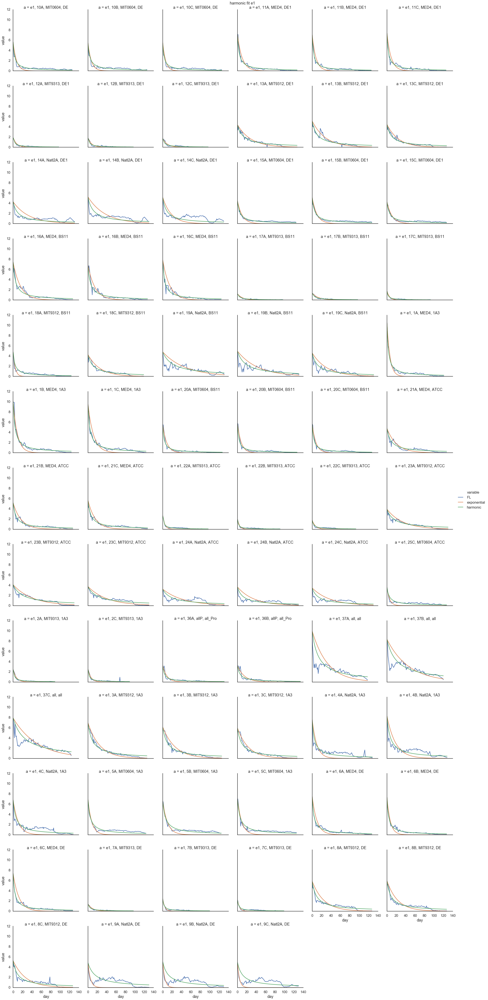

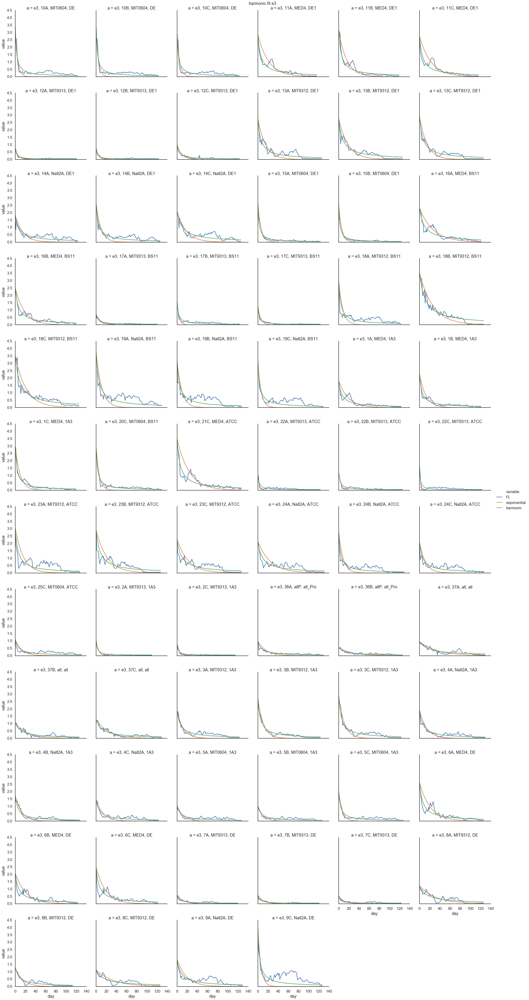

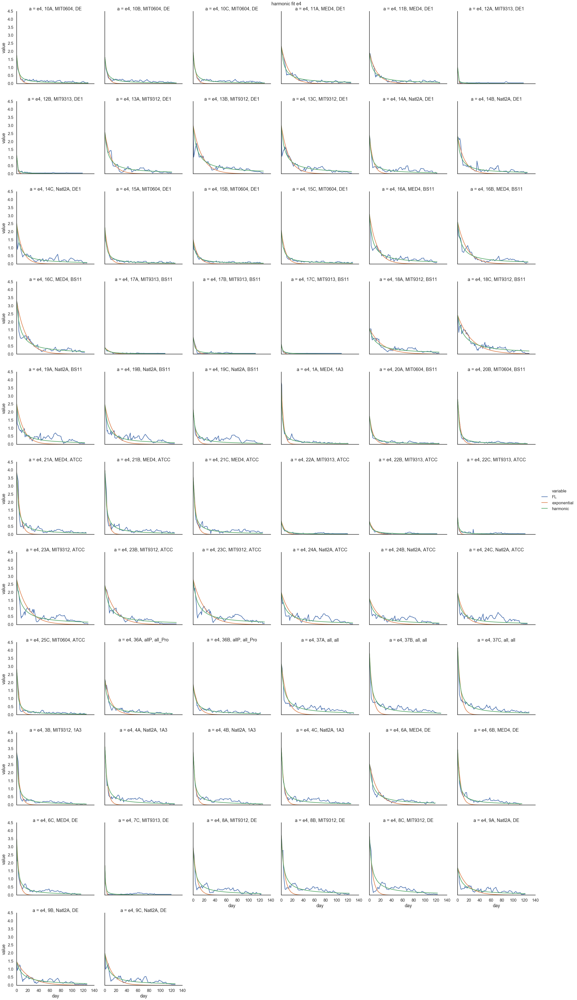

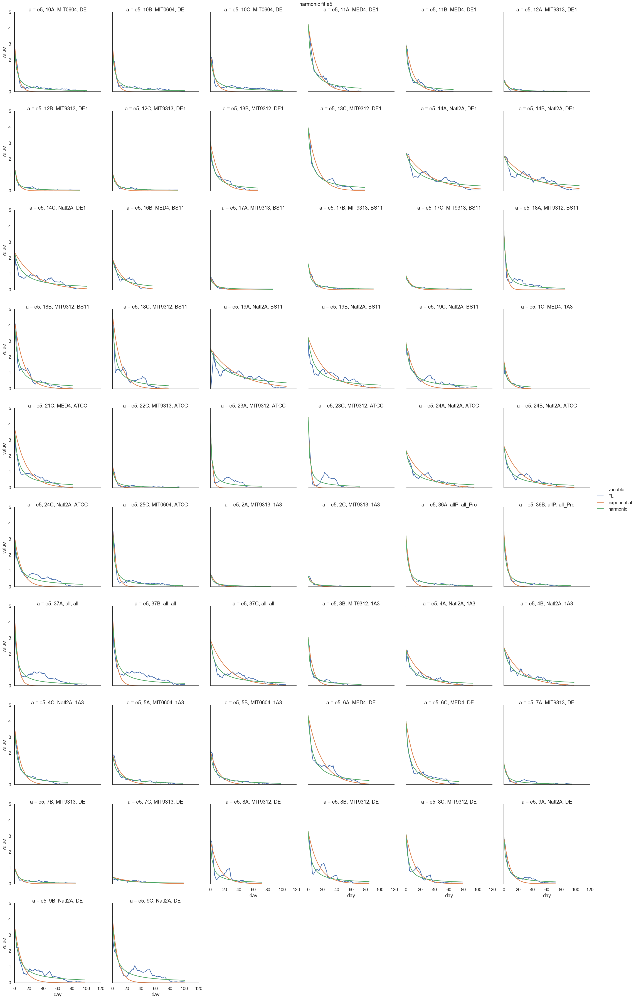

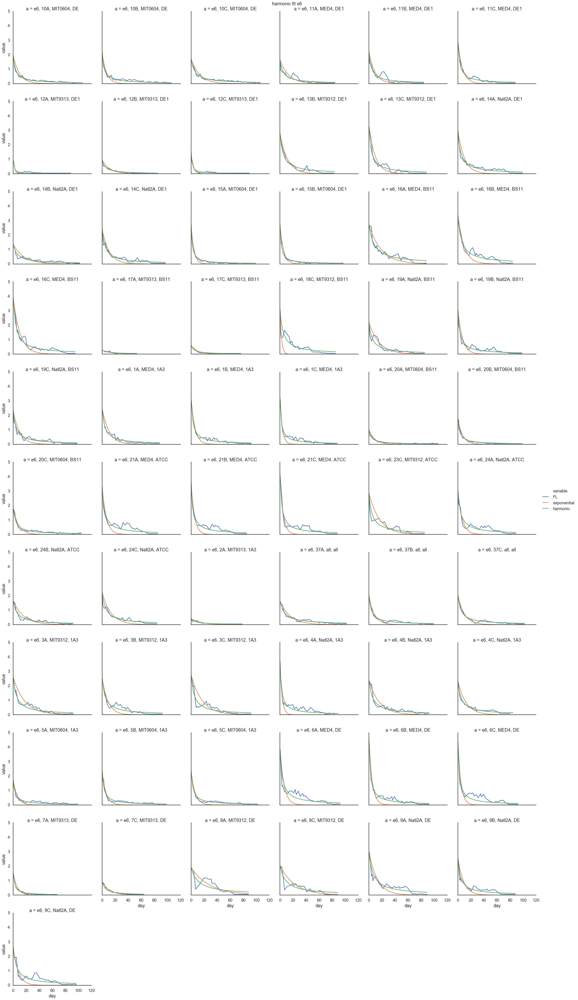

In [104]:
sns.set_context('talk')
dfresm['a'] = dfresm['experiment_sample'] +', '+dfresm['PRO']+', '+dfresm['ALT']
#for p in dfresm.PRO.unique():
exponential_samples = best_model_df.loc[best_model_df.model == 'bic_harmonic', 'experiment_sample']
for e in dfresm.experiment.unique():
    sns.relplot(data=dfresm.loc[dfresm.experiment_sample.isin(exponential_samples) & 
                               (dfresm.experiment == e)
                               ], 
                    x='day',
                    y='value',
                    hue='variable',
                    col='a',
                    col_wrap=6,
                    kind='line',
                   )
    plt.suptitle(f'harmonic fit {e}', y=1)
    plt.show()

In [96]:
exponential_samples

Series([], Name: experiment_sample, dtype: object)

In [37]:
dfresm.columns

Index(['experiment_sample', 'day', 'experiment', 'sample', 'PRO', 'ALT',
       'culture', 'variable', 'value'],
      dtype='object')

# Compare Models

In [115]:
dfscore.loc[dfscore.culture.isin(['Axenic'])]

,experiment_sample,experiment,sample,PRO,ALT,culture,exponential_popt_0,exponential_popt_1,exponential_popt_2,rmse_exponential,...,rmse_hyperbolic_5,bic_hyperbolic,harmonic_popt_0,harmonic_popt_1,harmonic_popt_2,rmse_harmonic,rmse_harmonic_60,rmse_harmonic_5,bic_harmonic,p
49,"e1, 26C",e1,26C,MIT0604,Ax_Pro,Axenic,0.265980,6.028605,0.5,0.334378,...,1.423169,-150.371829,1.227676,4.953524,1.0,0.644830,0.015899,2.577197,-62.291573,MIT0604_Axenic
50,"e1, 27A",e1,27A,Natl2A,Ax_Pro,Axenic,0.250285,5.462720,1.0,0.270836,...,1.007293,-203.563742,1.098452,5.480826,0.5,0.486540,0.013742,1.930767,-107.921774,Natl2A_Axenic
51,"e1, 27B",e1,27B,Natl2A,Ax_Pro,Axenic,0.264765,5.908457,0.5,0.264328,...,1.016403,-204.085052,1.194482,5.925603,1.0,0.472709,0.015470,1.873900,-112.593640,Natl2A_Axenic
52,"e1, 27C",e1,27C,Natl2A,Ax_Pro,Axenic,0.224661,5.521243,0.5,0.301419,...,1.112274,-187.881778,0.917691,5.247932,1.0,0.584227,0.020000,2.321223,-78.280675,Natl2A_Axenic
53,"e1, 28A",e1,28A,MIT9312,Ax_Pro,Axenic,0.327386,8.072840,1.0,0.362103,...,1.690560,-137.672599,1.725821,5.808273,0.5,0.727776,0.013962,3.241257,-42.077784,MIT9312_Axenic
54,"e1, 28B",e1,28B,MIT9312,Ax_Pro,Axenic,0.327122,7.987696,0.5,0.388653,...,NaN,NaN,1.447897,5.652444,1.0,0.726858,0.010541,3.228870,-42.279826,MIT9312_Axenic
55,"e1, 28C",e1,28C,MIT9312,Ax_Pro,Axenic,0.333792,7.209425,1.0,0.238846,...,1.107854,-202.809242,1.639295,5.861709,1.0,0.574169,0.012399,2.546756,-80.009110,MIT9312_Axenic
56,"e1, 29A",e1,29A,MIT9313,Ax_Pro,Axenic,0.219669,2.879231,1.0,0.121883,...,0.379811,-341.205891,0.680970,2.170706,0.5,0.211832,0.016938,0.847234,-245.708323,MIT9313_Axenic
57,"e1, 29B",e1,29B,MIT9313,Ax_Pro,Axenic,0.222334,3.114171,1.0,0.122604,...,NaN,NaN,0.707761,2.399816,0.5,0.225642,0.015007,0.898884,-235.350801,MIT9313_Axenic
58,"e1, 29C",e1,29C,MIT9313,Ax_Pro,Axenic,0.219444,2.588971,0.5,0.084541,...,NaN,NaN,0.804890,2.406889,1.0,0.172880,0.018911,0.694188,-279.031946,MIT9313_Axenic
